# Feature selection with null importances

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu, chi2_contingency, ttest_ind

# automated feature engineering
import featuretools as ft

# Filter out pandas warnings
import warnings

warnings.filterwarnings("ignore")

start = "\033[1m"  # Bold text
end = "\033[0;0m"  # Reset text
from IPython.core.interactiveshell import InteractiveShell
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import KFold
import time
from lightgbm import LGBMClassifier
import lightgbm as lgb

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import os

%matplotlib inline

import sys

sys.path.append("../")
from helpers import *

In [2]:
import os
import pandas as pd
import sys

sys.path.append("../")
from helpers import *

In [3]:
if os.path.exists("../features_data/feature_matrix_final.csv"):
    feature_matrix_spec = pd.read_csv("../features_data/feature_matrix_final.csv")


feature_matrix_spec.head(10)
feature_matrix_spec = clean_feature_names(feature_matrix_spec)
feature_matrix_spec.replace([np.inf, -np.inf], np.nan, inplace=True)

In [4]:
data = feature_matrix_spec

# categorical_feats = [
#     f
#     for f in data.columns
#     if data[f].dtype == "object" or data[f].dtype.name == "category"
# ]

# categorical_feats
# for f_ in categorical_feats:
#     data[f_], _ = pd.factorize(data[f_])
#     # Set feature type as categorical
#     data[f_] = data[f_].astype("category")


# def encode_features(data):
#     for col in data.select_dtypes(include=["category", "object"]).columns:
#         data[col] = pd.factorize(data[col])[0]
#     return data


# def get_feature_importances(data, shuffle, seed=None):
#     # Specify the features and target variable
#     train_features = [f for f in data if f not in ["TARGET", "SK_ID_CURR"]]
#     y = data["TARGET"].copy()

#     # Shuffle the target if required
#     if shuffle:
#         y = data["TARGET"].sample(frac=1.0, random_state=seed)

#     # Set up the data matrix for XGBoost
#     dtrain = xgb.DMatrix(data[train_features], label=y)

#     # XGBoost parameters
#     xgb_params = {
#         "objective": "binary:logistic",
#         "colsample_bylevel": 0.7,
#         "colsample_bynode": 1.0,
#         "colsample_bytree": 0.7,
#         "gamma": 5.0,
#         "learning_rate": 0.08807219785563987,
#         "max_depth": 4,
#         "min_child_weight": 3,
#         "n_estimators": 300,
#         "reg_alpha": 1e-05,
#         "reg_lambda": 1.0,
#         "subsample": 0.85,
#         "tree_method": "gpu_hist",
#         "seed": seed,
#         "enable_categorical": True,
#     }

#     # Train the model
#     clf = xgb.train(xgb_params, dtrain, num_boost_round=200)

#     # Get feature importances
#     importance_gain = clf.get_score(importance_type="gain")
#     importance_split = clf.get_score(importance_type="weight")

#     # Create a DataFrame to store feature importances
#     imp_df = pd.DataFrame(
#         {
#             "feature": list(importance_gain.keys()),
#             "importance_gain": list(importance_gain.values()),
#             "importance_split": [
#                 importance_split.get(f, 0) for f in importance_gain.keys()
#             ],
#         }
#     )

#     return imp_df


# # Initialize random seed
# np.random.seed(123)

# data_encoded = encode_features(data.copy())
# actual_imp_df = get_feature_importances(data=data_encoded, shuffle=False)
# print(actual_imp_df.head())

# # Running multiple shuffles to estimate null importance
# null_imp_df = pd.DataFrame()
# nb_runs = 100
# start = time.time()
# dsp = ""

# for i in range(nb_runs):
#     imp_df = get_feature_importances(data=data_encoded, shuffle=True, seed=i)
#     imp_df["run"] = i + 1
#     null_imp_df = pd.concat([null_imp_df, imp_df], axis=0)

#     # Erase previous message
#     print("\r" + " " * len(dsp), end="")
#     # Display current run and time used
#     spent = (time.time() - start) / 60
#     dsp = "Done with %4d of %4d (Spent %5.1f min)" % (i + 1, nb_runs, spent)
#     print("\r" + dsp, end="")

In [5]:
# null_imp_df.to_csv("../importances/null_importances_distribution_rf_final.csv")
# actual_imp_df.to_csv("../importances/actual_importances_ditribution_rf_final.csv")

In [6]:
null_imp_df = pd.read_csv("../importances/null_importances_distribution_rf_final.csv")
# drop unnamed column
null_imp_df.drop(null_imp_df.columns[0], axis=1, inplace=True)
actual_imp_df = pd.read_csv(
    "../importances/actual_importances_ditribution_rf_final.csv"
)
actual_imp_df.drop(actual_imp_df.columns[0], axis=1, inplace=True)

null_imp_df.head()
actual_imp_df.head()

,feature,importance_gain,importance_split
0,NAME_CONTRACT_TYPE,282.746096,6
1,CODE_GENDER,4887.967188,89
2,FLAG_OWN_CAR,149.629799,4
3,AMT_INCOME_TOTAL,938.896204,23
4,AMT_CREDIT,5376.895796,102


In [7]:
def display_distributions(actual_imp_df_, null_imp_df_, feature_):
    plt.figure(figsize=(13, 6))
    gs = gridspec.GridSpec(1, 2)
    # Plot Split importances
    ax = plt.subplot(gs[0, 0])
    a = ax.hist(
        null_imp_df_.loc[
            null_imp_df_["feature"] == feature_, "importance_split"
        ].values,
        label="Null importances",
    )
    ax.vlines(
        x=actual_imp_df_.loc[
            actual_imp_df_["feature"] == feature_, "importance_split"
        ].mean(),
        ymin=0,
        ymax=np.max(a[0]),
        color="r",
        linewidth=10,
        label="Real Target",
    )
    ax.legend()
    ax.set_title("Split Importance of %s" % feature_.upper(), fontweight="bold")
    plt.xlabel("Null Importance (split) Distribution for %s " % feature_.upper())
    # Plot Gain importances
    ax = plt.subplot(gs[0, 1])
    a = ax.hist(
        null_imp_df_.loc[null_imp_df_["feature"] == feature_, "importance_gain"].values,
        label="Null importances",
    )
    ax.vlines(
        x=actual_imp_df_.loc[
            actual_imp_df_["feature"] == feature_, "importance_gain"
        ].mean(),
        ymin=0,
        ymax=np.max(a[0]),
        color="r",
        linewidth=10,
        label="Real Target",
    )
    ax.legend()
    ax.set_title("Gain Importance of %s" % feature_.upper(), fontweight="bold")
    plt.xlabel("Null Importance (gain) Distribution for %s " % feature_.upper())

In [8]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

variab = "AMT_CREDIT"
# Create subplots for split and gain importance
fig = make_subplots(rows=1, cols=2, subplot_titles=(f"Split Importance of {variab}", f"Gain Importance of {variab}"))

null_importances_split = null_imp_df[null_imp_df['feature'] == variab]['importance_split'].tolist()

# Extracting the 'importance_gain' values for 'NAME_CONTRACT_TYPE' from null_imp_df
null_importances_gain = null_imp_df[null_imp_df['feature'] == variab]['importance_gain'].tolist()

# Extracting the actual importance value for 'NAME_CONTRACT_TYPE' from actual_imp_df
# We use the mean() method in case there are multiple runs, which could happen in some ensemble methods
actual_importance_split = actual_imp_df[actual_imp_df['feature'] == variab]['importance_split'].mean() 
actual_importance_gain = actual_imp_df[actual_imp_df['feature'] == variab]['importance_gain'].mean()

# Add the histograms for the null importances
fig.add_trace(go.Histogram(x=null_importances_split, name='Null importances', marker_color='grey'), row=1, col=1)
fig.add_trace(go.Histogram(x=null_importances_gain, name='Null importances', marker_color='grey'), row=1, col=2)

# Add a bar for the actual importance
fig.add_trace(go.Bar(x=[actual_importance_split], y=[max(null_importances_split)], name='Real Target', marker_color='darkorange', width=1), row=1, col=1)
fig.add_trace(go.Bar(x=[actual_importance_gain], y=[max(null_importances_gain)], name='Real Target', marker_color='darkorange', width=60), row=1, col=2)

# Update the layout to use a dark background, and adjust other formatting to match the image provided
fig.update_layout(
    template="plotly_dark",
    plot_bgcolor='rgba(0,0,0,1)',
    paper_bgcolor='rgba(0,0,0,1)',
    font=dict(color="white"),
    title={
        'text': "Feature Importance Distributions",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.1,
        xanchor="right",
        x=1,
    )
)

# Update y-axis range for both subplots
fig.update_yaxes(range=[0, 20], row=1, col=1)
fig.update_yaxes(range=[0, 20], row=1, col=2)

# Show the figure
fig.show()


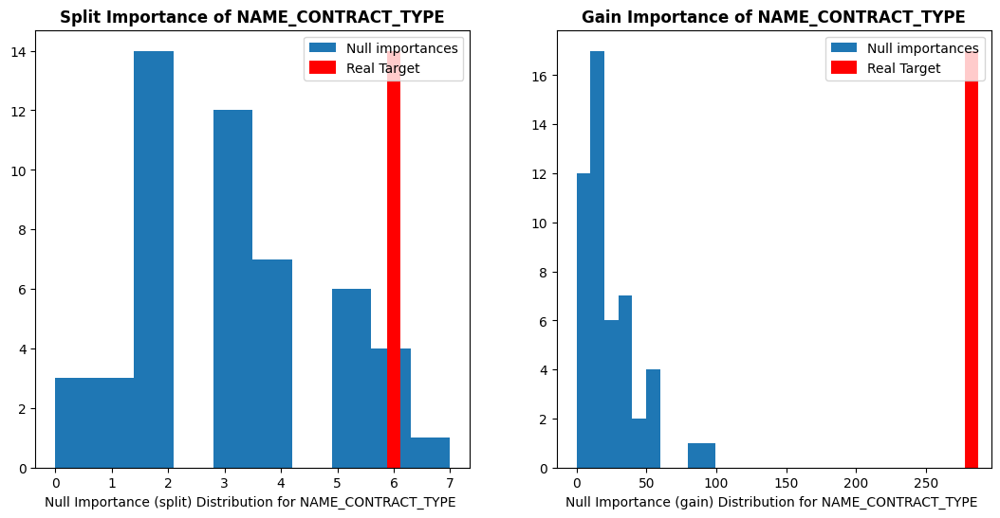

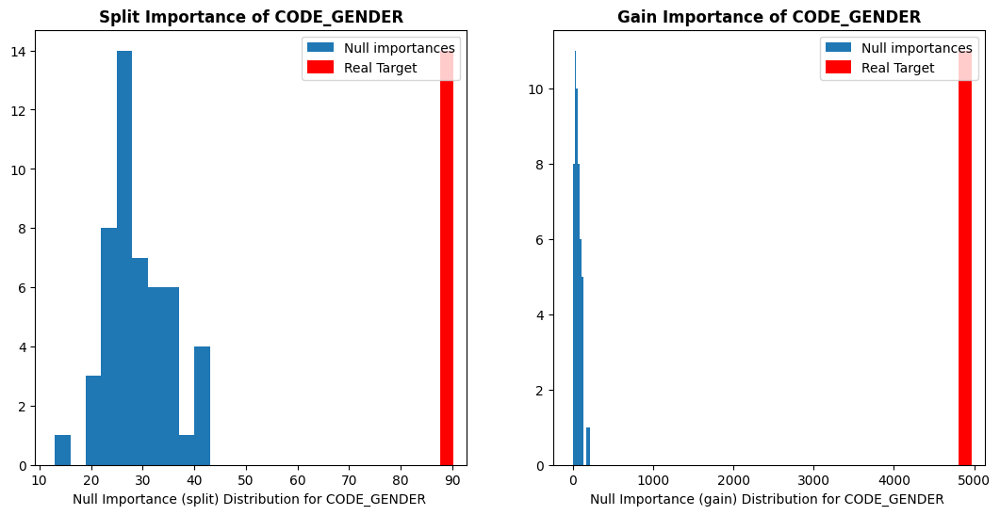

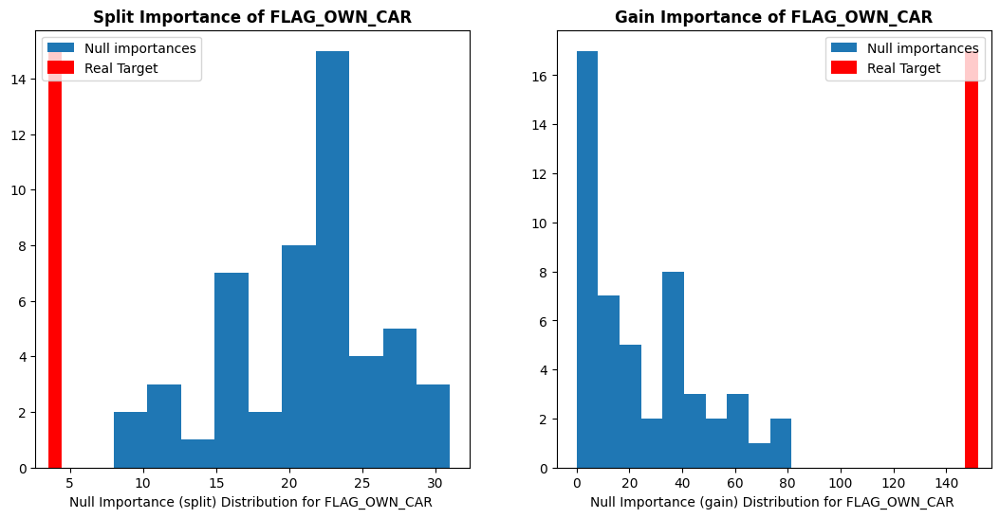

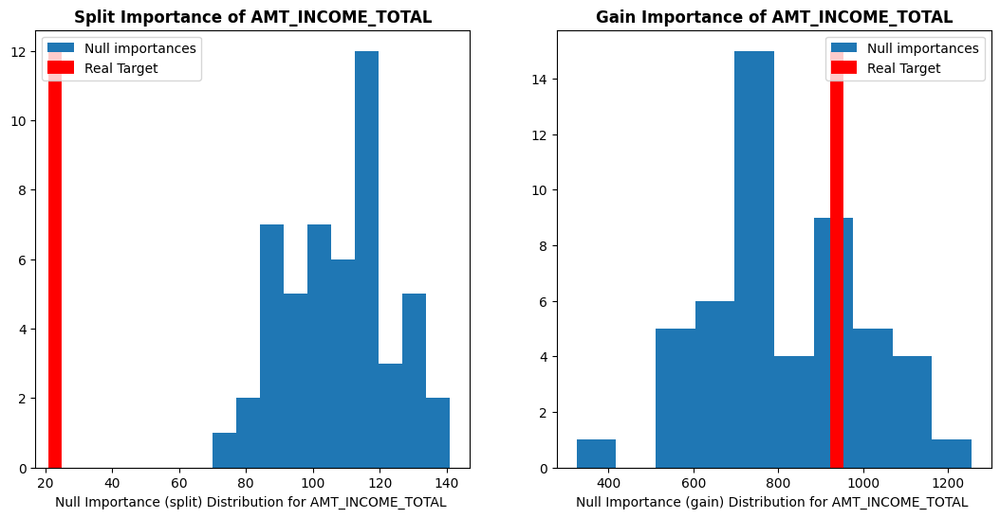

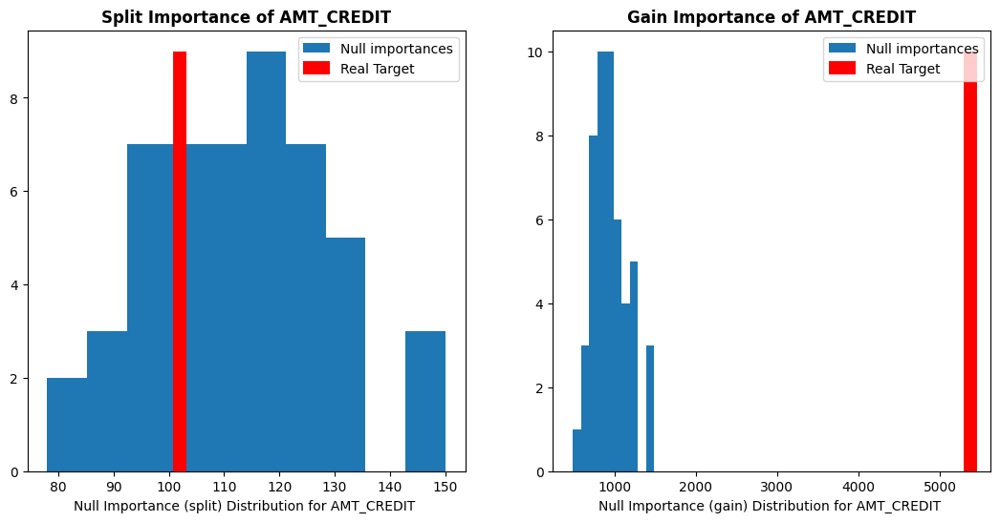

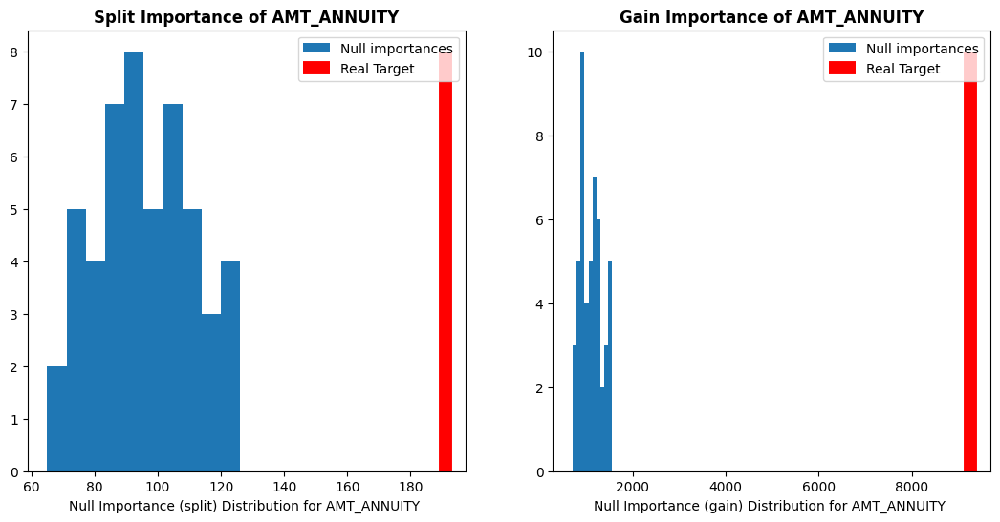

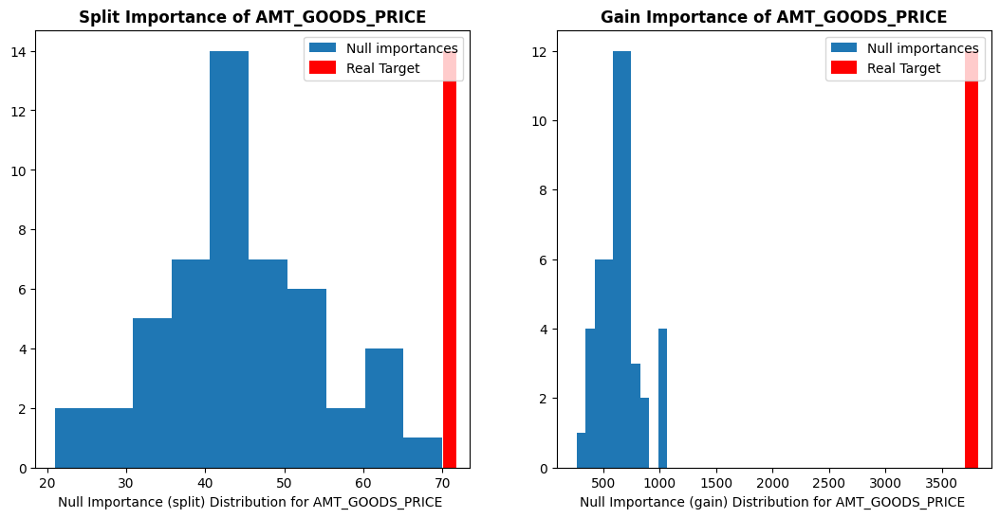

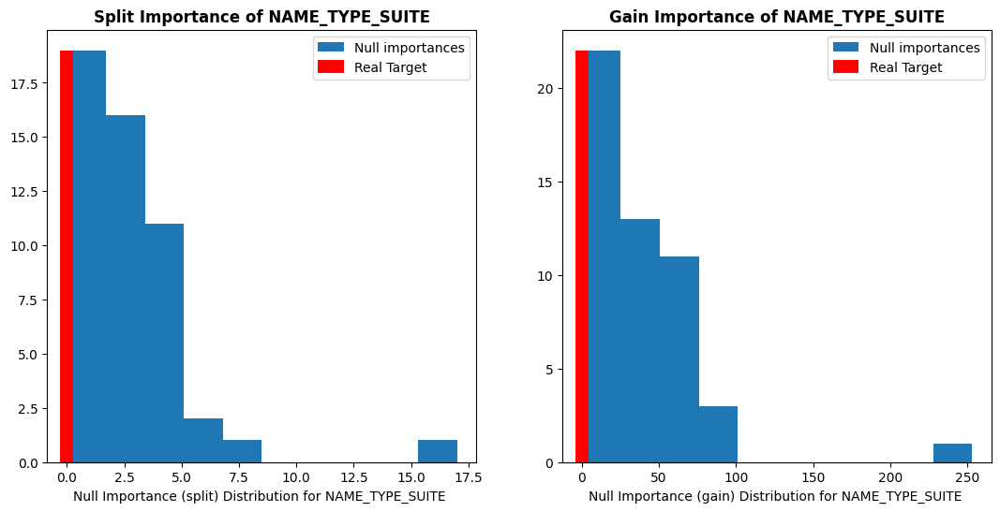

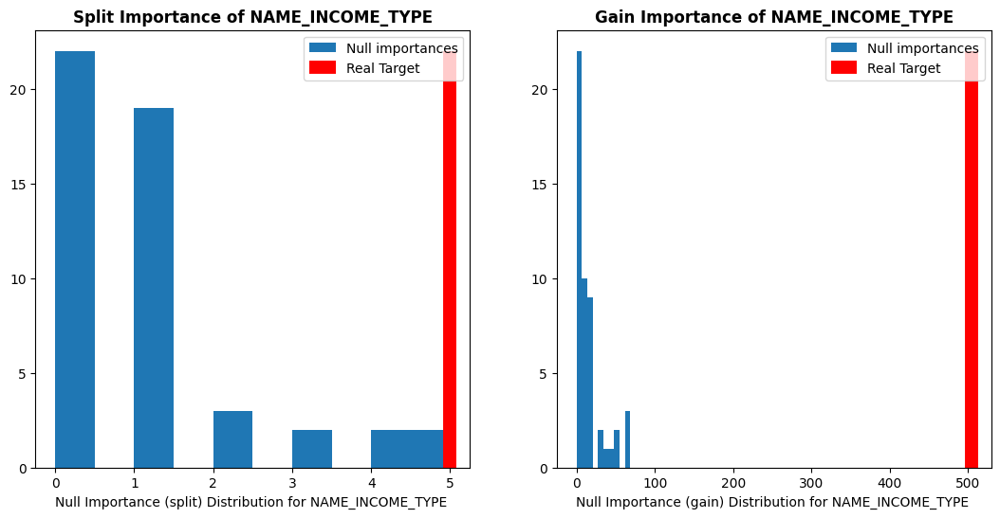

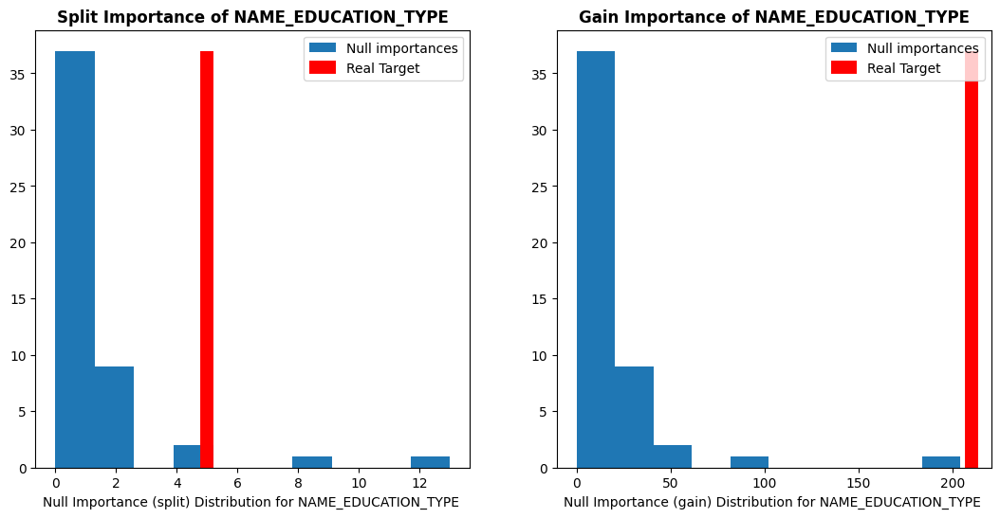

In [9]:
for feature in null_imp_df.feature[:10]:
    display_distributions(
        actual_imp_df_=actual_imp_df, null_imp_df_=null_imp_df, feature_=feature
    )

### Best features

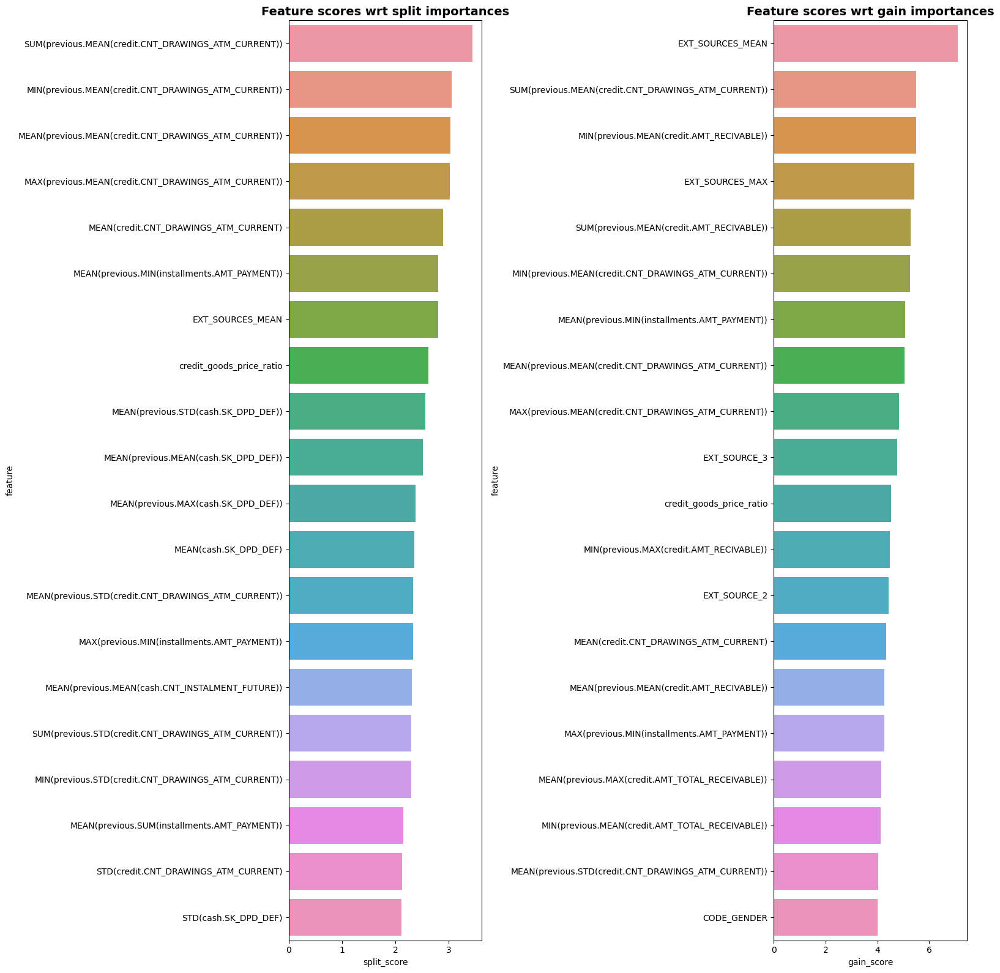

In [10]:
feature_scores = []
for _f in actual_imp_df["feature"].unique():
    f_null_imps_gain = null_imp_df.loc[
        null_imp_df["feature"] == _f, "importance_gain"
    ].values
    f_act_imps_gain = actual_imp_df.loc[
        actual_imp_df["feature"] == _f, "importance_gain"
    ].mean()
    if f_null_imps_gain.size > 0:
        gain_score = np.log(
            1e-10 + f_act_imps_gain / (1 + np.percentile(f_null_imps_gain, 75))
        )  # Avoid divide by zero
    else:
        gain_score = -1

    f_null_imps_split = null_imp_df.loc[
        null_imp_df["feature"] == _f, "importance_split"
    ].values
    f_act_imps_split = actual_imp_df.loc[
        actual_imp_df["feature"] == _f, "importance_split"
    ].mean()
    if f_null_imps_split.size > 0:
        split_score = np.log(
            1e-10 + f_act_imps_split / (1 + np.percentile(f_null_imps_split, 75))
        )  # Avoid divide by zero
    else:
        split_score = -1

    feature_scores.append((_f, split_score, gain_score))

scores_df = pd.DataFrame(
    feature_scores, columns=["feature", "split_score", "gain_score"]
)

plt.figure(figsize=(16, 16))
gs = gridspec.GridSpec(1, 2)
# Plot Split importances
ax = plt.subplot(gs[0, 0])
sns.barplot(
    x="split_score",
    y="feature",
    data=scores_df.sort_values("split_score", ascending=False).iloc[0:20],
    ax=ax,
)
ax.set_title("Feature scores wrt split importances", fontweight="bold", fontsize=14)
# Plot Gain importances
ax = plt.subplot(gs[0, 1])
sns.barplot(
    x="gain_score",
    y="feature",
    data=scores_df.sort_values("gain_score", ascending=False).iloc[0:20],
    ax=ax,
)
ax.set_title("Feature scores wrt gain importances", fontweight="bold", fontsize=14)
plt.tight_layout();

In [41]:
import plotly.graph_objects as go

# Assuming `scores_df` is already created with the necessary calculations

# Create subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("Feature scores wrt split importances", "Feature scores wrt gain importances"))

# Sort the dataframe for split scores
sorted_split_scores = scores_df.sort_values("split_score", ascending=False).iloc[0:20]
sorted_gain_scores = scores_df.sort_values("gain_score", ascending=False).iloc[0:20]
sorted_split_scores = sorted_split_scores[::-1]
sorted_gain_scores = sorted_gain_scores[::-1]
# Add Split Importance Bar Chart
fig.add_trace(
    go.Bar(
        x=sorted_split_scores['split_score'],
        y=sorted_split_scores['feature'],
        orientation='h',
        marker_color='rgba(40, 80, 120, 0.7)',
        name='Split Importance'
    ),
    row=1, col=1
)

# Add Gain Importance Bar Chart
fig.add_trace(
    go.Bar(
        x=sorted_gain_scores['gain_score'],
        y=sorted_gain_scores['feature'],
        orientation='h',
        marker_color='rgba(88, 141, 138, 0.7)',
        name='Gain Importance'
    ),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title="Feature Importances",
    template="plotly_dark",
    height=900,  # Adjust height according to the number of features or personal preference
    width=2000,
    plot_bgcolor='rgba(0,0,0,1)',  # Transparent background
    paper_bgcolor='rgba(0,0,0,1)',  # Transparent background
    legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.1,
    xanchor="right",
    x=1,
    )
)

# Update axes
fig.update_xaxes(title_text="Score", row=1, col=1)
fig.update_xaxes(title_text="Score", row=1, col=2)

fig.update_yaxes(title_text="Features", row=1, col=1)
fig.update_yaxes(title_text="Features", row=1, col=2)

fig.show()


### Worst features

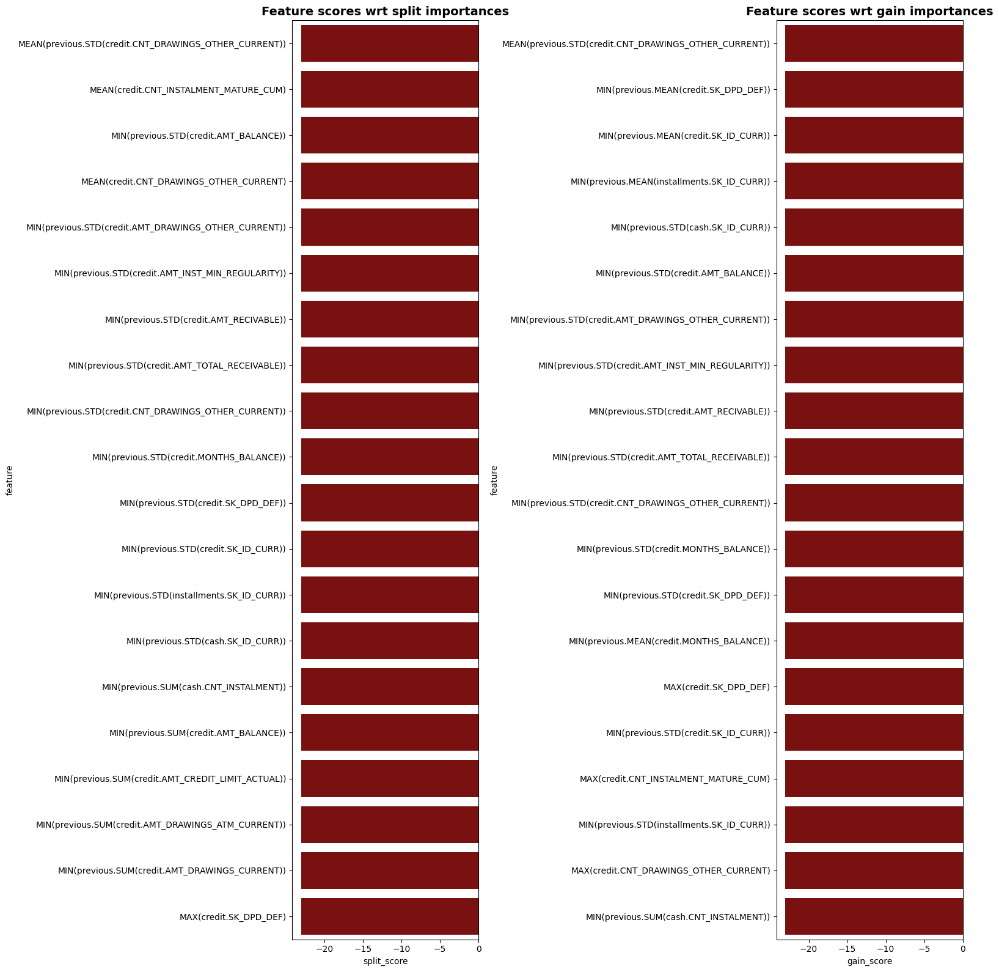

In [12]:
plt.figure(figsize=(16, 16))
gs = gridspec.GridSpec(1, 2)
# Plot Split importances
ax = plt.subplot(gs[0, 0])
sns.barplot(
    x="split_score",
    y="feature",
    data=scores_df.sort_values("split_score", ascending=True).iloc[0:20],
    ax=ax,
    color="darkred",
)
ax.set_title("Feature scores wrt split importances", fontweight="bold", fontsize=14)
# Plot Gain importances
ax = plt.subplot(gs[0, 1])
sns.barplot(
    x="gain_score",
    y="feature",
    data=scores_df.sort_values("gain_score", ascending=True).iloc[0:20],
    ax=ax,
    color="darkred",
)
ax.set_title("Feature scores wrt gain importances", fontweight="bold", fontsize=14)
plt.tight_layout();

### Removing useless features

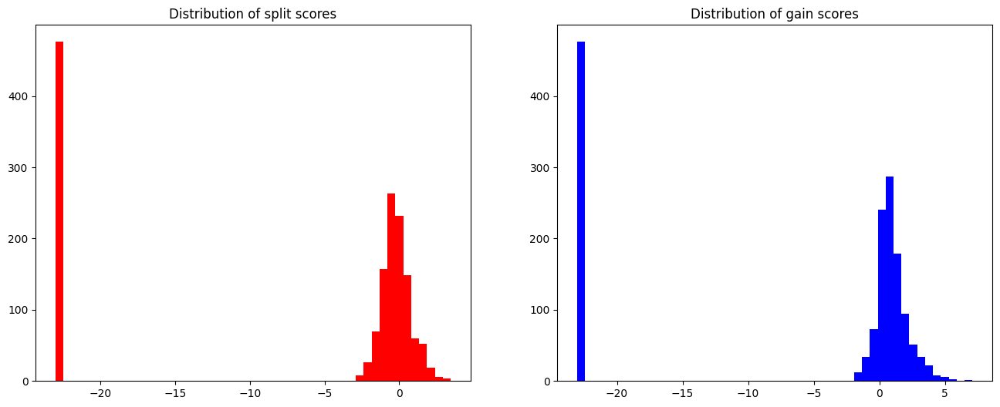

In [13]:
# plot the distribution of both split and gain scores
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.hist(scores_df["split_score"], bins=50, color="r")
plt.title("Distribution of split scores")

plt.subplot(1, 2, 2)
plt.hist(scores_df["gain_score"], bins=50, color="b")
plt.title("Distribution of gain scores")
plt.show();

In [14]:
split_score_threshold = 0
gain_score_threshold = 0

# Filter features based on thresholds
useful_features = scores_df[
    (scores_df["split_score"] > split_score_threshold)
    & (scores_df["gain_score"] > gain_score_threshold)
]

len(useful_features)

# remove keep only useful features from feature matrix
feature_matrix_spec_testing = feature_matrix_spec[
    ["TARGET"] + useful_features.feature.to_list()
]

#### Data preparation

In [15]:
from sklearn.model_selection import train_test_split

dummied_feature_matrix = pd.get_dummies(feature_matrix_spec_testing)
len(dummied_feature_matrix.columns)
features = dummied_feature_matrix
# Only numeric features
features = features.select_dtypes("number")

# Extract the labels
labels = np.array(features["TARGET"].astype(np.int32)).reshape((-1,))
# features = features.drop(columns = ['TARGET'])

# filter features to only include top features
features = features[dummied_feature_matrix.columns.to_list()]

# Split into training and testing data
train_features, test_features, train_labels, test_labels = train_test_split(
    features, labels, random_state=42
)

# Separate features and target for the training data
X_train = train_features.drop(columns=["TARGET"])
y_train = train_features["TARGET"]

# Separate features and target for the testing data
X_test = test_features.drop(columns=["TARGET"])
y_test = test_features["TARGET"]

X_train = clean_feature_names(X_train)
X_test = clean_feature_names(X_test)
X_test = clean_feature_names(X_test)

# Replace infinite values with NaN
X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

print("Final Train shape: ", X_train.shape)
print("Final Test shape: ", X_test.shape)

Final Train shape:  (230633, 511)
Final Test shape:  (76878, 511)


In [16]:
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
from sklearn.impute import SimpleImputer

# Impute missing values
imputer = SimpleImputer(strategy="mean")
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Initialize and train the model
model = XGBClassifier(
    use_label_encoder=False, eval_metric="logloss", verbosity=0, tree_method="gpu_hist"
)
model.fit(X_train_imputed, y_train)

# Predict probabilities and calculate AUC
y_pred_proba = model.predict_proba(X_test_imputed)[:, 1]
auc = roc_auc_score(y_test, y_pred_proba)
auc

0.7701022407136137

ONLY GAIN:

- all data: 0.7719411159577487
- -0.5: 0.7717095331804574
- 0: 0.769894327841386
- 0.5: 0.7707913483484126

BOTH FILTERS:
- all data: 0.7719411159577487
- -2: 0.7704187927031303
- -1: 0.7717690272817496

- **0: 0.7747575124653406(best)**

-  0.5: 0.7735819909664436
-  2: 0.7087799366001187

### Removing highly correlated features

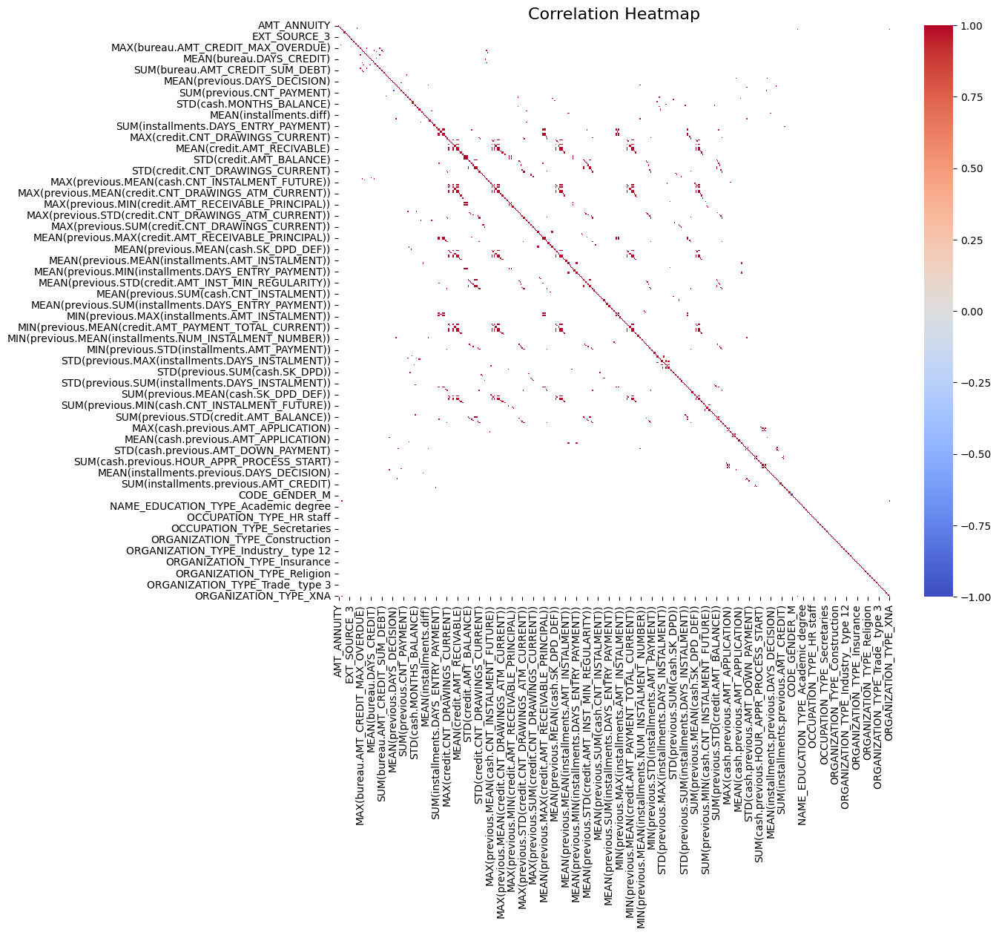

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Generate the correlation matrix
corr = X_train.corr()

# Create a mask to display only correlations above a certain threshold
mask = corr.abs() <= 0.95

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap="coolwarm", center=0, vmin=-1, vmax=1, annot=False)
plt.title("Correlation Heatmap", fontsize=16)
plt.show();

In [56]:
corr = X_train.corr()


In [68]:
import plotly.graph_objects as go

# Create a mask for correlations that are above a certain threshold
# mask should have the values between -0.5 and 0.95

# Create a mask for correlations that are not above 0.95
mask = corr <= 0.95

# Apply mask, setting values not of interest to NaN
masked_corr = corr.mask(mask)


In [76]:
import plotly.graph_objects as go
import pandas as pd


# Assuming 'masked_corr' is your masked correlation DataFrame
fig = go.Figure(data=go.Heatmap(
    z=masked_corr.to_numpy(),  # Convert DataFrame to numpy array
    x=masked_corr.columns,
    y=masked_corr.index,
    colorscale=[  # Define a custom colorscale with proper normalization
        [0, 'rgba(88, 141, 138, 0.7)'],  # Teal color at the lowest value
        [0, 'rgba(88, 141, 138, 0)'],  # Fade to transparent at middle
        [0.9, 'rgba(88, 141, 138, 0)'],  # Fade to transparent at middle
        [1, 'darkorange']  # Dark orange at the highest value
    ],
    zmin=-1,  # Minimum value of correlation scale
    zmax=1   # Maximum value of correlation scale
))

# Update the layout for a dark theme and add title
fig.update_layout(
    title='',
    template='plotly_dark',
    xaxis=dict(tickangle=-45),
    yaxis=dict(side='left'),
    width=1500,
    height=1200,
    coloraxis_colorbar=dict(
        title='Correlation',
        ticks='outside',
        lenmode='pixels', len=200
    ),
    # make background transparent
    plot_bgcolor='rgba(0,0,0,1)',
    paper_bgcolor='rgba(0,0,0,1)',
)
# Show the plot
fig.show()




In [77]:
def remove_highly_correlated_features(X, threshold=0.95):
    # Create correlation matrix
    corr_matrix = X.corr().abs()

    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

    # Find index of feature columns with correlation greater than the threshold
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

    return to_drop


# Identify the features to drop from the training set
features_to_drop = remove_highly_correlated_features(X_train, threshold=0.95)

# Drop the features from the training set
X_train_reduced = X_train.drop(columns=features_to_drop)

# Drop the same features from the test set
X_test_reduced = X_test.drop(columns=features_to_drop)

print("Reduced training set shape:", X_train_reduced.shape)
print("Reduced test set shape:", X_test_reduced.shape)

Reduced training set shape: (230633, 305)
Reduced test set shape: (76878, 305)


In [78]:
from sklearn.metrics import roc_auc_score
from xgboost import XGBClassifier
from sklearn.impute import SimpleImputer

# Initialize and train the model
model = XGBClassifier(
    use_label_encoder=False, eval_metric="logloss", verbosity=0, tree_method="gpu_hist"
)
model.fit(X_train_reduced, y_train)

# Predict probabilities and calculate AUC
y_pred_proba = model.predict_proba(X_test_reduced)[:, 1]
auc = roc_auc_score(y_test, y_pred_proba)
auc

0.7696311459636292

Percentage of features dropped after removing highly correlated features

In [67]:
len(features_to_drop) / X_train.shape[1] * 100

16.599190283400812

<Figure size 2000x200 with 0 Axes>

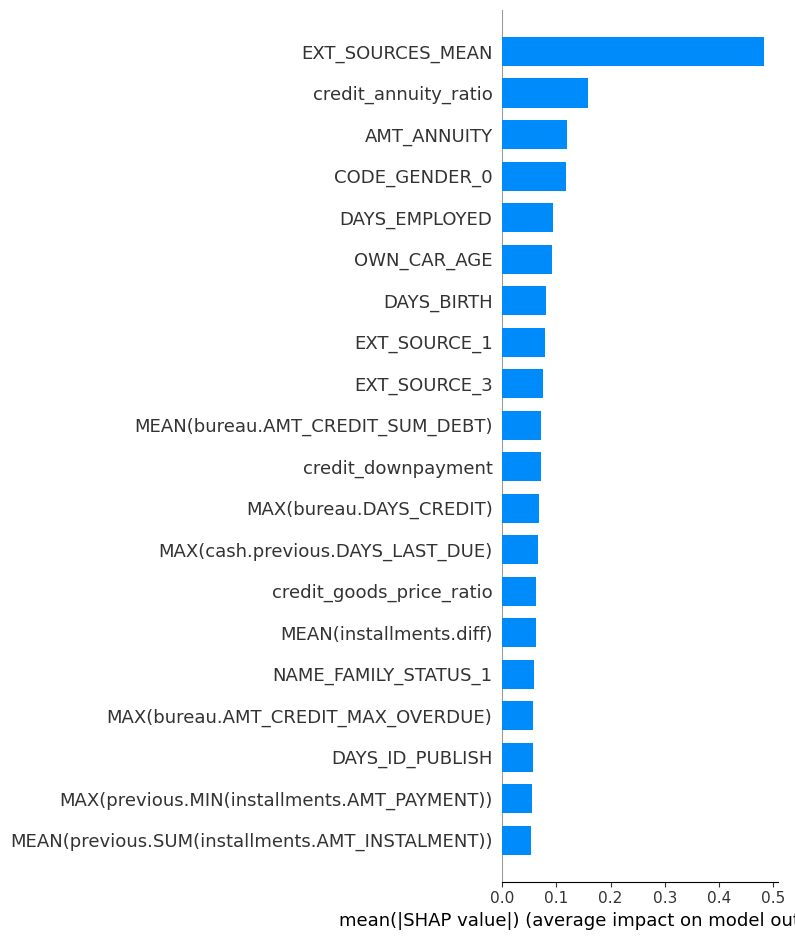

In [96]:
import xgboost as xgb
import shap
import matplotlib.pyplot as plt

explainer = shap.Explainer(model)
shap_values = explainer(X_train_reduced)

# Summarize the effects of all the features
shap.summary_plot(shap_values, X_train_reduced, feature_names=X_train_reduced.columns, plot_type="bar")

# Show the plot
plt.show()


## Saving the train/test data

In [92]:
print("Final Train shape: ", X_train_reduced.shape)
print("Final Test shape: ", X_test_reduced.shape)

Final Train shape:  (230633, 206)
Final Test shape:  (76878, 206)


In [91]:
# save train and test to disk
X_train_reduced.to_csv("../training_data/X_train_reduced.csv", index=False)
y_train.to_csv("../training_data/y_train.csv", index=False)
X_test_reduced.to_csv("../training_data/X_test_reduced.csv", index=False)
y_test.to_csv("../training_data/y_test.csv", index=False)